In [1]:
import os
import sys
import torch as t
from torch import nn, optim
import einops
from einops.layers.torch import Rearrange
from tqdm import tqdm
from dataclasses import dataclass, field
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset, Subset
import numpy as np
from typing import Optional, Tuple, List, Literal, Union
import plotly.express as px
import torchinfo
import time
import wandb
from PIL import Image
import pandas as pd
from pathlib import Path
from datasets import load_dataset

# Make sure exercises are in the path
chapter = r"chapter0_fundamentals"
exercises_dir = Path(f"{os.getcwd().split(chapter)[0]}/{chapter}/exercises").resolve()
section_dir = exercises_dir / "part5_gans_and_vaes"
if str(exercises_dir) not in sys.path: sys.path.append(str(exercises_dir))

from part2_cnns.utils import print_param_count
import part5_gans_and_vaes.tests as tests
import part5_gans_and_vaes.solutions as solutions
from plotly_utils import imshow

from part2_cnns.solutions import (
    Linear,
    ReLU,
    Sequential,
    BatchNorm2d,
)
from part2_cnns.solutions_bonus import (
    pad1d,
    pad2d,
    conv1d_minimal,
    conv2d_minimal,
    Conv2d,
    Pair,
    IntOrPair,
    force_pair,
)

device = t.device("cuda" if t.cuda.is_available() else "cpu")

MAIN = __name__ == "__main__"

# GANs

#### Optional exercise - what conditions must hold for the discriminator's best strategy to be random guessing with probability 0.5?

The generator needs to be producing outputs that are indistinguishable from real images. If the generator learns the actual distribution of the inputs and can generate from it perfectly, there is no strategy that the discriminator can learn that will be better than random guessing.

## Transposed Convolutions

In [2]:
class ConvTranspose2d(nn.Module):
    def __init__(
        self, in_channels: int, out_channels: int, kernel_size: IntOrPair, stride: IntOrPair = 1, padding: IntOrPair = 0
    ):
        '''
        Same as torch.nn.ConvTranspose2d with bias=False.
        '''
        super().__init__()

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding

        kernel_size = force_pair(kernel_size)
        sf = 1 / (self.out_channels * kernel_size[0] * kernel_size[1]) ** 0.5

        self.weight = nn.Parameter(sf * (2 * t.rand(in_channels, out_channels, *kernel_size) - 1))

    def forward(self, x: t.Tensor) -> t.Tensor:
        return solutions.conv_transpose2d(x, self.weight, self.stride, self.padding)

    def extra_repr(self) -> str:
        return ", ".join([
            f"{key}={getattr(self, key)}"
            for key in ["in_channels", "out_channels", "kernel_size", "stride", "padding"]
        ])

In [3]:
class Tanh(nn.Module):
    def forward(self, x: t.Tensor) -> t.Tensor:
        return t.tanh(x)

tests.test_Tanh(Tanh)

All tests in `test_Tanh` passed.


In [4]:
class LeakyReLU(nn.Module):
    def __init__(self, negative_slope: float = 0.01):
        super().__init__()
        self.negative_slope = negative_slope

    def forward(self, x: t.Tensor) -> t.Tensor:
        return self.negative_slope * t.clip(x, max=0) + t.clip(x, min=0)

    def extra_repr(self) -> str:
        return ", ".join([
            f"{key}={getattr(self, key)}"
            for key in ["negative_slope"]
        ])

tests.test_LeakyReLU(LeakyReLU)

All tests in `test_LeakyReLU` passed.


In [5]:
class Sigmoid(nn.Module):
    def forward(self, x: t.Tensor) -> t.Tensor:
        return 1 / (1 + t.exp(-x))

tests.test_Sigmoid(Sigmoid)

All tests in `test_Sigmoid` passed.


### Building a DCGAN

In [6]:



class Generator(nn.Module):

    def __init__(
        self,
        latent_dim_size: int = 100,
        img_size: int = 64,
        img_channels: int = 3,
        hidden_channels: List[int] = [128, 256, 512],
    ):
        '''
        Implements the generator architecture from the DCGAN paper (the diagram at the top
        of page 4). We assume the size of the activations doubles at each layer (so image
        size has to be divisible by 2 ** len(hidden_channels)).

        Args:
            latent_dim_size:
                the size of the latent dimension, i.e. the input to the generator
            img_size:
                the size of the image, i.e. the output of the generator
            img_channels:
                the number of channels in the image (3 for RGB, 1 for grayscale)
            hidden_channels:
                the number of channels in the hidden layers of the generator (starting from
                the smallest / closest to the generated images, and working backwards to the 
                latent vector).

        '''
        n_layers = len(hidden_channels)
        assert img_size % (2 ** n_layers) == 0, "activation size must double at each layer"

        super().__init__()
        self.latent_dim_size = latent_dim_size
        self.img_size = img_size
        self.img_channels = img_channels
        self.hidden_channels = list(reversed(hidden_channels))

        hw = img_size // 2**n_layers
        linear_out_size = self.hidden_channels[0] * hw**2

        self.linear_reshape = Sequential(
            Linear(latent_dim_size, linear_out_size, bias=False),
            Rearrange(f"b (c h w) -> b c h w", h=hw, w=hw),
            BatchNorm2d(self.hidden_channels[0]),
            ReLU(),           
        )

        upsample = []
        for channels_in, channels_out in zip(self.hidden_channels[:-1], self.hidden_channels[1:]):
            upsample.extend([
                ConvTranspose2d(channels_in, channels_out, kernel_size=4, stride=2, padding=1),
                BatchNorm2d(channels_out),
                ReLU(),
            ])
        self.upsample = Sequential(*upsample)

        self.to_image = Sequential(
            ConvTranspose2d(self.hidden_channels[-1], img_channels, kernel_size=4, stride=2, padding=1),
            Tanh(),            
        )

        self.model = Sequential(
            self.linear_reshape,
            self.upsample,
            self.to_image
        )

    def forward(self, x: t.Tensor) -> t.Tensor:
        return self.model(x)


class Discriminator(nn.Module):

    def __init__(
        self,
        img_size: int = 64,
        img_channels: int = 3,
        hidden_channels: List[int] = [128, 256, 512],
    ):
        '''
        Implements the discriminator architecture from the DCGAN paper (the mirror image of
        the diagram at the top of page 4). We assume the size of the activations doubles at
        each layer (so image size has to be divisible by 2 ** len(hidden_channels)).

        Args:
            img_size:
                the size of the image, i.e. the input of the discriminator
            img_channels:
                the number of channels in the image (3 for RGB, 1 for grayscale)
            hidden_channels:
                the number of channels in the hidden layers of the discriminator (starting from
                the smallest / closest to the input image, and working forwards to the probability
                output).
        '''
        n_layers = len(hidden_channels)
        assert img_size % (2 ** n_layers) == 0, "activation size must double at each layer"

        super().__init__()
        self.img_size = img_size
        self.img_channels = img_channels
        self.hidden_channels = hidden_channels

        hw = img_size // 2**n_layers
        linear_in_size = hidden_channels[-1] * hw**2

        self.img_embed = Sequential(
            Conv2d(img_channels, hidden_channels[0], kernel_size=4, stride=2, padding=1),
            LeakyReLU(),
        )
        
        downsample = []
        for channels_in, channels_out in zip(self.hidden_channels[:-1], self.hidden_channels[1:]):
            downsample.extend([
                Conv2d(channels_in, channels_out, kernel_size=4, stride=2, padding=1),
                BatchNorm2d(channels_out),
                LeakyReLU(negative_slope=0.2),
            ])
        self.downsample = Sequential(*downsample)

        self.predict = Sequential(
            Rearrange("b c h w -> b (c h w)"),
            Linear(linear_in_size, 1, bias=False),
            Sigmoid()
        )

        self.model = Sequential(
            self.img_embed,
            self.downsample,
            self.predict,
        )
        

    def forward(self, x: t.Tensor) -> t.Tensor:
        return self.model(x)


def initialize_weights(model: nn.Module) -> None:
    '''
    Initializes weights according to the DCGAN paper, by modifying model weights in place.
    '''
    for m in model.modules():
        if isinstance(m, (Linear, Conv2d, ConvTranspose2d)):
            nn.init.normal_(m.weight.data, mean=0.0, std=0.02)
        if isinstance(m, BatchNorm2d):
            nn.init.normal_(m.weight.data, mean=1.0, std=0.02)
            nn.init.constant_(m.bias.data, val=0.0)
            

class DCGAN(nn.Module):
    netD: Discriminator
    netG: Generator

    def __init__(
        self,
        latent_dim_size: int = 100,
        img_size: int = 64,
        img_channels: int = 3,
        hidden_channels: List[int] = [128, 256, 512],
    ):
        '''
        Implements the DCGAN architecture from the DCGAN paper (i.e. a combined generator
        and discriminator).
        '''
        super().__init__()
        self.latent_dim_size = latent_dim_size
        self.img_size = img_size
        self.img_channels = img_channels

        self.netD = Discriminator(img_size, img_channels, hidden_channels)
        self.netG = Generator(latent_dim_size, img_size, img_channels, hidden_channels)
        initialize_weights(self)

In [7]:
print_param_count(Generator(), solutions.DCGAN().netG)
print_param_count(Discriminator(), solutions.DCGAN().netD)

Model 1, total params = 5906176
Model 2, total params = 5906176
All parameter counts match!


,name_1,shape_1,num_params_1,num_params_2,shape_2,name_2
0,linear_reshape.0.weight,"(32768, 100)",3276800,3276800,"(32768, 100)",project_and_reshape.0.weight
1,linear_reshape.2.weight,"(512,)",512,512,"(512,)",project_and_reshape.2.weight
2,linear_reshape.2.bias,"(512,)",512,512,"(512,)",project_and_reshape.2.bias
3,upsample.0.weight,"(512, 256, 4, 4)",2097152,2097152,"(512, 256, 4, 4)",hidden_layers.0.0.weight
4,upsample.1.weight,"(256,)",256,256,"(256,)",hidden_layers.0.1.weight
5,upsample.1.bias,"(256,)",256,256,"(256,)",hidden_layers.0.1.bias
6,upsample.3.weight,"(256, 128, 4, 4)",524288,524288,"(256, 128, 4, 4)",hidden_layers.1.0.weight
7,upsample.4.weight,"(128,)",128,128,"(128,)",hidden_layers.1.1.weight
8,upsample.4.bias,"(128,)",128,128,"(128,)",hidden_layers.1.1.bias
9,to_image.0.weight,"(128, 3, 4, 4)",6144,6144,"(128, 3, 4, 4)",hidden_layers.2.0.weight


Model 1, total params = 2661888
Model 2, total params = 2661888
All parameter counts match!


,name_1,shape_1,num_params_1,num_params_2,shape_2,name_2
0,img_embed.0.weight,"(128, 3, 4, 4)",6144,6144,"(128, 3, 4, 4)",hidden_layers.0.0.weight
1,downsample.0.weight,"(256, 128, 4, 4)",524288,524288,"(256, 128, 4, 4)",hidden_layers.1.0.weight
2,downsample.1.weight,"(256,)",256,256,"(256,)",hidden_layers.1.1.weight
3,downsample.1.bias,"(256,)",256,256,"(256,)",hidden_layers.1.1.bias
4,downsample.3.weight,"(512, 256, 4, 4)",2097152,2097152,"(512, 256, 4, 4)",hidden_layers.2.0.weight
5,downsample.4.weight,"(512,)",512,512,"(512,)",hidden_layers.2.1.weight
6,downsample.4.bias,"(512,)",512,512,"(512,)",hidden_layers.2.1.bias
7,predict.1.weight,"(1, 32768)",32768,32768,"(1, 32768)",classifier.1.weight


In [8]:
model = DCGAN().to(device)
x = t.randn(3, 100).to(device)
real = solutions.DCGAN().to(device)

statsG_real = torchinfo.summary(real.netG, input_data=x)
statsG = torchinfo.summary(model.netG, input_data=x)

statsD = torchinfo.summary(model.netD, input_data=model.netG(x))
statsD_real = torchinfo.summary(real.netD, input_data=real.netG(x))

print(statsG)
print(statsG_real)
print()
print(statsD)
print(statsD_real)


Layer (type:depth-idx)                   Output Shape              Param #
Generator                                [3, 3, 64, 64]            --
├─Sequential: 1-1                        [3, 3, 64, 64]            --
│    └─Sequential: 2-1                   [3, 512, 8, 8]            --
│    │    └─Linear: 3-1                  [3, 32768]                3,276,800
│    │    └─Rearrange: 3-2               [3, 512, 8, 8]            --
│    │    └─BatchNorm2d: 3-3             [3, 512, 8, 8]            1,024
│    │    └─ReLU: 3-4                    [3, 512, 8, 8]            --
│    └─Sequential: 2-2                   [3, 128, 32, 32]          --
│    │    └─ConvTranspose2d: 3-5         [3, 256, 16, 16]          2,097,152
│    │    └─BatchNorm2d: 3-6             [3, 256, 16, 16]          512
│    │    └─ReLU: 3-7                    [3, 256, 16, 16]          --
│    │    └─ConvTranspose2d: 3-8         [3, 128, 32, 32]          524,288
│    │    └─BatchNorm2d: 3-9             [3, 128, 32, 32]     

### Loading data 

In [9]:
from datasets import load_dataset

# Load the dataset
dataset = load_dataset("nielsr/CelebA-faces")
print("Dataset loaded.")

# Create path to save the data
celeb_data_dir = section_dir / "data" / "celeba" / "img_align_celeba"
if not celeb_data_dir.exists():
    os.makedirs(celeb_data_dir)

    # Iterate over the dataset and save each image
    for idx, item in tqdm(enumerate(dataset["train"]), total=len(dataset["train"]), desc="Saving individual images..."):
        # The image is already a JpegImageFile, so we can directly save it
        item["image"].save(exercises_dir / "part5_gans_and_vaes" / "data" / "celeba" / "img_align_celeba" / f"{idx:06}.jpg")

    print("All images have been saved.")

Dataset loaded.


In [10]:
def get_dataset(dataset: Literal["MNIST", "CELEB"], train: bool = True) -> Dataset:
    assert dataset in ["MNIST", "CELEB"]

    if dataset == "CELEB":
        image_size = 64
        assert train, "CelebA dataset only has a training set"
        transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])
        trainset = datasets.ImageFolder(
            root = exercises_dir / "part5_gans_and_vaes" / "data" / "celeba",
            transform = transform
        )

    elif dataset == "MNIST":
        img_size = 28
        transform = transforms.Compose([
            transforms.Resize(img_size),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ])
        trainset = datasets.MNIST(
            root = exercises_dir / "part5_gans_and_vaes" / "data",
            transform = transform,
            download = True,
        )

    return trainset

In [11]:
def display_data(x: t.Tensor, nrows: int, title: str):
    '''Displays a batch of data, using plotly.'''
    # Reshape into the right shape for plotting (make it 2D if image is monochrome)
    y = einops.rearrange(x, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=nrows).squeeze()
    # Normalize, in the 0-1 range
    y = (y - y.min()) / (y.max() - y.min())
    # Display data
    imshow(
        y, binary_string=(y.ndim==2), height=50*(nrows+5),
        title=title + f"<br>single input shape = {x[0].shape}"
    )


# # Load in MNIST, get first batch from dataloader, and display
# trainset_mnist = get_dataset("MNIST")
# x = next(iter(DataLoader(trainset_mnist, batch_size=64)))[0]
# display_data(x, nrows=8, title="MNIST data")

# # Load in CelebA, get first batch from dataloader, and display
# trainset_celeb = get_dataset("CELEB")
# x = next(iter(DataLoader(trainset_celeb, batch_size=64)))[0]
# display_data(x, nrows=8, title="CalebA data")

### Training loop 

In [14]:
@dataclass
class DCGANArgs():
    '''
    Class for the arguments to the DCGAN (training and architecture).
    Note, we use field(defaultfactory(...)) when our default value is a mutable object.
    '''
    latent_dim_size: int = 100
    hidden_channels: List[int] = field(default_factory=lambda: [128, 256, 512])
    dataset: Literal["MNIST", "CELEB"] = "CELEB"
    batch_size: int = 256
    epochs: int = 3
    lr: float = 0.0002
    betas: Tuple[float] = (0.5, 0.999)
    seconds_between_eval: int = 20
    wandb_project: Optional[str] = 'day5-gan'
    wandb_name: Optional[str] = None


class DCGANTrainer:
    def __init__(self, args: DCGANArgs):
        self.args = args

        self.trainset = get_dataset(self.args.dataset)
        self.trainloader = DataLoader(self.trainset, batch_size=args.batch_size, shuffle=True)

        batch, img_channels, img_height, img_width = next(iter(self.trainloader))[0].shape
        assert img_height == img_width

        self.model = DCGAN(
            args.latent_dim_size,
            img_height,
            img_channels,
            args.hidden_channels,
        ).to(device).train()

        self.optG = t.optim.Adam(self.model.netG.parameters(), lr=args.lr, betas=args.betas)
        self.optD = t.optim.Adam(self.model.netD.parameters(), lr=args.lr, betas=args.betas)

    def loss_discriminator(self, img_real: t.Tensor, img_fake: t.Tensor) -> t.Tensor:
        Dx = self.model.netD(img_real)
        DGz = self.model.netD(img_fake)        
        return - (t.log(Dx).mean() +  t.log(1 - DGz).mean())

    def loss_generator(self, img_fake: t.Tensor) -> t.Tensor:
        DGz = self.model.netD(img_fake)
        return - t.log(DGz).mean()
            

    def training_step_discriminator(self, img_real: t.Tensor, img_fake: t.Tensor) -> t.Tensor:
        '''
        Generates a real and fake image, and performs a gradient step on the discriminator 
        to maximize log(D(x)) + log(1-D(G(z))).
        '''
        self.optD.zero_grad()
        loss = self.loss_discriminator(img_real, img_fake)
        loss.backward()
        self.optD.step()
        return loss
        


    def training_step_generator(self, img_fake: t.Tensor) -> t.Tensor:
        '''
        Performs a gradient step on the generator to maximize log(D(G(z))).
        '''
        self.optG.zero_grad()
        loss = self.loss_generator(img_fake)
        loss.backward()
        self.optG.step()
        return loss


    @t.inference_mode()
    def evaluate(self) -> None:
        '''
        Performs evaluation by generating 8 instances of random noise and passing them through
        the generator, then logging the results to Weights & Biases.
        '''
        self.model.netG.eval()

        # Generate random noise
        t.manual_seed(14312)
        noise = t.randn(8, self.model.latent_dim_size).to(device)
        # Get generator output, turn it into an array
        arrays = einops.rearrange(self.model.netG(noise), "b c h w -> b h w c").cpu().numpy()
        # Log to weights and biases
        wandb.log({"images": [wandb.Image(arr) for arr in arrays]}, step=self.step)

        self.model.netG.train()


    def train(self) -> None:
        '''
        Performs a full training run, while logging to Weights & Biases.
        '''
        self.step = 0
        last_log_time = time.time()
        wandb.init(project=self.args.wandb_project, name=self.args.wandb_name)
        wandb.watch(self.model)

        try:

            for epoch in range(self.args.epochs):
    
                progress_bar = tqdm(self.trainloader, total=len(self.trainloader))
    
                for (img_real, label) in progress_bar:
    
                    # Generate random noise & fake image
                    noise = t.randn(self.args.batch_size, self.args.latent_dim_size).to(device)
                    img_real = img_real.to(device)
                    img_fake = self.model.netG(noise)
    
                    # Training steps
                    lossD = self.training_step_discriminator(img_real, img_fake.detach())
                    lossG = self.training_step_generator(img_fake)
    
                    # Log data
                    wandb.log(dict(lossD=lossD, lossG=lossG), step=self.step)
    
                    # Update progress bar
                    self.step += img_real.shape[0]
                    progress_bar.set_description(f"{epoch=}, lossD={lossD:.4f}, lossG={lossG:.4f}, examples_seen={self.step}")
    
                    # Evaluate model on the same batch of random data
                    if time.time() - last_log_time > self.args.seconds_between_eval:
                        last_log_time = time.time()
                        self.evaluate()
        except:
            pass
        finally:
            wandb.finish()


# # Arguments for MNIST
# args = DCGANArgs(
#     dataset="MNIST",
#     hidden_channels=[32, 64],
#     epochs=15,
#     batch_size=32,
#     seconds_between_eval=20,
# )
# trainer = DCGANTrainer(args)
# trainer.train()

# Arguments for CelebA
args = DCGANArgs(
    dataset="CELEB",
    hidden_channels=[128, 256, 512],
    batch_size=8,
    epochs=3,
    seconds_between_eval=30,
)
trainer = DCGANTrainer(args)
trainer.train()

epoch=0, lossD=1.2976, lossG=0.9881, examples_seen=202599: 100%|█| 25325/25325 [37:25<00:00, 11.28it/s
epoch=1, lossD=1.4341, lossG=0.8711, examples_seen=405198: 100%|█| 25325/25325 [36:54<00:00, 11.43it/s
epoch=2, lossD=1.3871, lossG=0.8632, examples_seen=502518:  48%|▍| 12165/25325 [17:33<18:59, 11.54it/s


lossD,▅▁▁▂▅█▃▃▄▄▆▄▆▅▄▅▅▄▅▅▅▅▄▄▅▅▅▄▅▅▄▄▃▄▄▅▄▄▅▄
lossG,█▅▄▄▂▂▃▃▂▂▁▂▁▁▂▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▂▁▂▁▁▁▁▁▁▁
lossD,1.38707
lossG,0.86322


# Autoencoders and VAEs

## Autoencoders

In [42]:
class Autoencoder(nn.Module):

    def __init__(self, latent_dim_size: int, hidden_dim_size: int):
        super().__init__()
        self.img_channels = 1
        self.conv_channels = [16, 32]
        self.img_size = 28

        hw_inner = int(self.img_size / 2**len(self.conv_channels))
        linear_in_size = hw_inner**2 * self.conv_channels[-1]
        
        self.latent_dim_size = latent_dim_size
        self.hidden_dim_size = hidden_dim_size
        
        self.encoder = Sequential(
            Conv2d(in_channels=self.img_channels, out_channels=self.conv_channels[0], kernel_size=4, stride=2, padding=1),
            ReLU(),
            Conv2d(in_channels=self.conv_channels[0], out_channels=self.conv_channels[1], kernel_size=4, stride=2, padding=1),
            ReLU(),
            Rearrange("b c h w -> b (c h w)"),
            Linear(in_features=linear_in_size, out_features=hidden_dim_size),
            ReLU(),
            Linear(in_features=hidden_dim_size, out_features=latent_dim_size),
        )

        self.decoder = Sequential(
            Linear(in_features=latent_dim_size, out_features=hidden_dim_size),
            ReLU(),
            Linear(in_features=hidden_dim_size, out_features=linear_in_size),
            Rearrange("b (c h w) -> b c h w", h=hw_inner, w=hw_inner),
            ReLU(),
            ConvTranspose2d(in_channels=self.conv_channels[1], out_channels=self.conv_channels[0], kernel_size=4, stride=2, padding=1),
            ReLU(),
            ConvTranspose2d(in_channels=self.conv_channels[0], out_channels=self.img_channels, kernel_size=4, stride=2, padding=1),
        )

    def forward(self, x: t.Tensor) -> t.Tensor:
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [43]:
soln_Autoencoder = solutions.Autoencoder(latent_dim_size=5, hidden_dim_size=128)
my_Autoencoder = Autoencoder(latent_dim_size=5, hidden_dim_size=128)

print_param_count(my_Autoencoder, soln_Autoencoder)

Model 1, total params = 421413
Model 2, total params = 421413
All parameter counts match!


,name_1,shape_1,num_params_1,num_params_2,shape_2,name_2
0,encoder.0.weight,"(16, 1, 4, 4)",256,256,"(16, 1, 4, 4)",encoder.0.weight
1,encoder.2.weight,"(32, 16, 4, 4)",8192,8192,"(32, 16, 4, 4)",encoder.2.weight
2,encoder.5.weight,"(128, 1568)",200704,200704,"(128, 1568)",encoder.5.weight
3,encoder.5.bias,"(128,)",128,128,"(128,)",encoder.5.bias
4,encoder.7.weight,"(5, 128)",640,640,"(5, 128)",encoder.7.weight
5,encoder.7.bias,"(5,)",5,5,"(5,)",encoder.7.bias
6,decoder.0.weight,"(128, 5)",640,640,"(128, 5)",decoder.0.weight
7,decoder.0.bias,"(128,)",128,128,"(128,)",decoder.0.bias
8,decoder.2.weight,"(1568, 128)",200704,200704,"(1568, 128)",decoder.2.weight
9,decoder.2.bias,"(1568,)",1568,1568,"(1568,)",decoder.2.bias


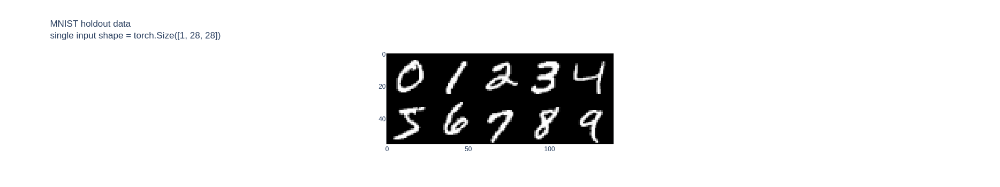

In [44]:
testset = get_dataset("MNIST", train=False)
HOLDOUT_DATA = dict()
for data, target in DataLoader(testset, batch_size=1):
    if target.item() not in HOLDOUT_DATA:
        HOLDOUT_DATA[target.item()] = data.squeeze()
        if len(HOLDOUT_DATA) == 10: break
HOLDOUT_DATA = t.stack([HOLDOUT_DATA[i] for i in range(10)]).to(dtype=t.float, device=device).unsqueeze(1)

display_data(HOLDOUT_DATA, nrows=2, title="MNIST holdout data")

### Autoencoder training

In [48]:
@dataclass
class AutoencoderArgs():
    latent_dim_size: int = 5
    hidden_dim_size: int = 128
    dataset: Literal["MNIST", "CELEB"] = "MNIST"
    batch_size: int = 512
    epochs: int = 10
    lr: float = 1e-3
    betas: Tuple[float] = (0.5, 0.999)
    seconds_between_eval: int = 5
    wandb_project: Optional[str] = 'day5-ae-mnist'
    wandb_name: Optional[str] = None


class AutoencoderTrainer:
    def __init__(self, args: AutoencoderArgs):
        self.args = args
        self.trainset = get_dataset(args.dataset)
        self.trainloader = DataLoader(self.trainset, batch_size=args.batch_size, shuffle=True)
        self.model = Autoencoder(
            latent_dim_size = args.latent_dim_size,
            hidden_dim_size = args.hidden_dim_size,
        ).to(device)
        self.criterion = nn.MSELoss()
        self.optimizer = t.optim.Adam(self.model.parameters(), lr=args.lr, betas=args.betas)

    def training_step(self, img: t.Tensor) -> t.Tensor:
        '''
        Performs a training step on the batch of images in `img`. Returns the loss.
        '''
        self.optimizer.zero_grad()
        out_img = self.model(img)
        loss = self.criterion(img, out_img)
        loss.backward()
        self.optimizer.step()
        return loss

    @t.inference_mode()
    def evaluate(self) -> None:
        '''
        Evaluates model on holdout data, logs to weights & biases.
        '''
        result = self.model(HOLDOUT_DATA).cpu().numpy()
        wandb.log({"images": [wandb.Image(img) for img in result]}, step=self.step)
        

    def train(self) -> None:
        '''
        Performs a full training run, logging to wandb.
        '''
        self.step = 0
        last_log_time = time.time()
        wandb.init(project=self.args.wandb_project, name=self.args.wandb_name)
        wandb.watch(self.model)

        for epoch in range(self.args.epochs):

            progress_bar = tqdm(self.trainloader, total=int(len(self.trainloader)))

            for i, (img, label) in enumerate(progress_bar): # remember that label is not used

                img = img.to(device)
                loss = self.training_step(img)
                wandb.log(dict(loss=loss), step=self.step)

                # Update progress bar
                self.step += img.shape[0]
                progress_bar.set_description(f"{epoch=}, {loss=:.4f}, examples_seen={self.step}")

                # Evaluate model on the same holdout data
                if time.time() - last_log_time > self.args.seconds_between_eval:
                    last_log_time = time.time()
                    self.evaluate()

        wandb.finish()


args = AutoencoderArgs()
trainer = AutoencoderTrainer(args)
trainer.train()

loss,▁
loss,0.99788


epoch=9, loss=0.2847, examples_seen=600000: 100%|███████████████████| 118/118 [00:17<00:00,  6.72it/s]


loss,█▇▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss,0.28467


### Generating images from an autoencoder

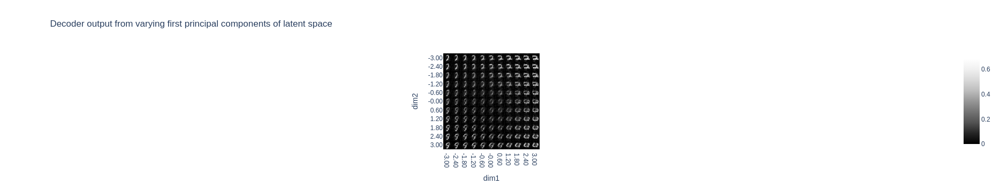

In [51]:
@t.inference_mode()
def visualise_output(
    model: Autoencoder,
    n_points: int = 11,
    interpolation_range: Tuple[float, float] = (-3, 3),
) -> None:
    '''
    Visualizes the output of the decoder, along the first two latent dims.
    '''
    # Constructing latent dim data by making two of the dimensions vary indep in the interpolation range
    grid_latent = t.zeros(n_points**2, model.latent_dim_size).to(device)
    x = t.linspace(*interpolation_range, n_points).to(device)
    grid_latent[:, 0] = einops.repeat(x, "dim1 -> (dim1 dim2)", dim2=n_points)
    grid_latent[:, 1] = einops.repeat(x, "dim2 -> (dim1 dim2)", dim1=n_points)

    # Pass through decoder
    output = model.decoder(grid_latent).cpu().numpy()

    # Normalize & truncate, then unflatten back into a grid shape
    output_truncated = np.clip((output * 0.3081) + 0.1307, 0, 1)
    output_single_image = einops.rearrange(
        output_truncated,
        "(dim1 dim2) 1 height width -> (dim1 height) (dim2 width)",
        dim1=n_points
    )

    # Display the results
    px.imshow(
        output_single_image,
        color_continuous_scale="greys_r",
        title="Decoder output from varying first principal components of latent space"
    ).update_layout(
        xaxis=dict(title_text="dim1", tickmode="array", tickvals=list(range(14, 14+28*n_points, 28)), ticktext=[f"{i:.2f}" for i in x]),
        yaxis=dict(title_text="dim2", tickmode="array", tickvals=list(range(14, 14+28*n_points, 28)), ticktext=[f"{i:.2f}" for i in x])
    ).show()


visualise_output(trainer.model)

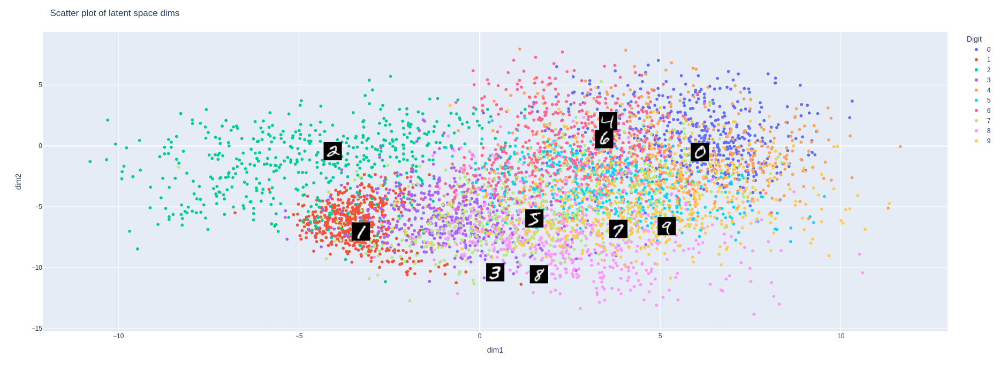

In [52]:
@t.inference_mode()
def visualise_input(
    model: Autoencoder,
    dataset: Dataset,
) -> None:
    '''
    Visualises (in the form of a scatter plot) the input data in the latent space, along the first two dims.
    '''
    # First get the model images' latent vectors, along first 2 dims
    imgs = t.stack([batch for batch, label in dataset]).to(device)
    latent_vectors = model.encoder(imgs)
    if latent_vectors.ndim == 3: latent_vectors = latent_vectors[0] # useful for VAEs later
    latent_vectors = latent_vectors[:, :2].cpu().numpy()
    labels = [str(label) for img, label in dataset]

    # Make a dataframe for scatter (px.scatter is more convenient to use when supplied with a dataframe)
    df = pd.DataFrame({"dim1": latent_vectors[:, 0], "dim2": latent_vectors[:, 1], "label": labels})
    df = df.sort_values(by="label")
    fig = px.scatter(df, x="dim1", y="dim2", color="label")
    fig.update_layout(height=700, width=700, title="Scatter plot of latent space dims", legend_title="Digit")
    data_range = df["dim1"].max() - df["dim1"].min()

    # Add images to the scatter plot (optional)
    output_on_data_to_plot = model.encoder(HOLDOUT_DATA.to(device))[:, :2].cpu()
    if output_on_data_to_plot.ndim == 3: output_on_data_to_plot = output_on_data_to_plot[0] # useful for VAEs; see later
    data_translated = (HOLDOUT_DATA.cpu().numpy() * 0.3081) + 0.1307
    data_translated = (255 * data_translated).astype(np.uint8).squeeze()
    for i in range(10):
        x, y = output_on_data_to_plot[i]
        fig.add_layout_image(
            source=Image.fromarray(data_translated[i]).convert("L"),
            xref="x", yref="y",
            x=x, y=y,
            xanchor="right", yanchor="top",
            sizex=data_range/15, sizey=data_range/15,
        )
    fig.show()


small_dataset = Subset(get_dataset("MNIST"), indices=range(0, 5000))    
visualise_input(trainer.model, small_dataset)

## Variational Autoencoders

#### State in your own words why we need the reparameterization trick in order to train our network.

Without reparameterization, there is a sampling operation from an arbitrary normal distribution between the loss and the parameters of the encoder. It is not clear how to directly differentiate through this sampling operation. Re-parameterization uses the nice property of the normal distribution $Z \sim N(\mu, \sigma) \implies Z = \sigma \cdot X + \mu$ where $X \sim N(0, 1)$.  The latter representation is a deterministic function of the network outputs and so easy to differentiate through.

#### Summarize in one sentence what concept we're capturing when we measure the KL divergence D(P||Q) between two distributions.

The KL divergence can be interpreted in a number of ways.  It is a measure of distance between P & Q but it treats P as the real distribution. One explanation is that D(P || Q) measures the how good Q is as a model of P, where lower scores are better models.  

### Building a VAE

In [61]:
class VAE(nn.Module):
    encoder: nn.Module
    decoder: nn.Module

    def __init__(self, latent_dim_size: int, hidden_dim_size: int):
        super().__init__()
        self.img_channels = 1
        self.conv_channels = [16, 32]
        self.img_size = 28

        hw_inner = int(self.img_size / 2**len(self.conv_channels))
        linear_in_size = hw_inner**2 * self.conv_channels[-1]
        
        self.latent_dim_size = latent_dim_size
        self.hidden_dim_size = hidden_dim_size
        
        self.encoder = Sequential(
            Conv2d(in_channels=self.img_channels, out_channels=self.conv_channels[0], kernel_size=4, stride=2, padding=1),
            ReLU(),
            Conv2d(in_channels=self.conv_channels[0], out_channels=self.conv_channels[1], kernel_size=4, stride=2, padding=1),
            ReLU(),
            Rearrange("b c h w -> b (c h w)"),
            Linear(in_features=linear_in_size, out_features=hidden_dim_size),
            ReLU(),
            Linear(in_features=hidden_dim_size, out_features=2*latent_dim_size),
            Rearrange("b (param value) -> b param value", param=2)
        )

        self.decoder = Sequential(
            Linear(in_features=latent_dim_size, out_features=hidden_dim_size),
            ReLU(),
            Linear(in_features=hidden_dim_size, out_features=linear_in_size),
            Rearrange("b (c h w) -> b c h w", h=hw_inner, w=hw_inner),
            ReLU(),
            ConvTranspose2d(in_channels=self.conv_channels[1], out_channels=self.conv_channels[0], kernel_size=4, stride=2, padding=1),
            ReLU(),
            ConvTranspose2d(in_channels=self.conv_channels[0], out_channels=self.img_channels, kernel_size=4, stride=2, padding=1),
        )

    def sample_latent_vector(self, x: t.Tensor) -> Tuple[t.Tensor, t.Tensor, t.Tensor]:
        '''
        Passes `x` through the encoder. Returns the mean and log std dev of the latent vector,
        as well as the latent vector itself. This function can be used in `forward`, but also
        used on its own to generate samples for evaluation.
        '''
        encoded = self.encoder(x)
        mu, logsigma = encoded[:, 0].squeeze(), encoded[:, 1].squeeze()
        y = t.randn(*mu.shape).to(x.device)
        z = logsigma.exp() * y + mu
        return (z, mu, logsigma)

    def forward(self, x: t.Tensor) -> Tuple[t.Tensor, t.Tensor, t.Tensor]:
        '''
        Passes `x` through the encoder and decoder. Returns the reconstructed input, as well
        as mu and logsigma.
        '''
        z, mu, logsigma = self.sample_latent_vector(x)
        x_prime = self.decoder(z)
        return (x_prime, mu, logsigma)

model = VAE(latent_dim_size=5, hidden_dim_size=100)

trainset_mnist = get_dataset("MNIST")
x = next(iter(DataLoader(trainset_mnist, batch_size=8)))[0]
print(torchinfo.summary(model, input_data=x))

Layer (type:depth-idx)                   Output Shape              Param #
VAE                                      [8, 1, 28, 28]            --
├─Sequential: 1-1                        [8, 2, 5]                 --
│    └─Conv2d: 2-1                       [8, 16, 14, 14]           256
│    └─ReLU: 2-2                         [8, 16, 14, 14]           --
│    └─Conv2d: 2-3                       [8, 32, 7, 7]             8,192
│    └─ReLU: 2-4                         [8, 32, 7, 7]             --
│    └─Rearrange: 2-5                    [8, 1568]                 --
│    └─Linear: 2-6                       [8, 100]                  156,900
│    └─ReLU: 2-7                         [8, 100]                  --
│    └─Linear: 2-8                       [8, 10]                   1,010
│    └─Rearrange: 2-9                    [8, 2, 5]                 --
├─Sequential: 1-2                        [8, 1, 28, 28]            --
│    └─Linear: 2-10                      [8, 100]                  600
│ 

In [62]:
soln_vae = solutions.VAE(latent_dim_size=5, hidden_dim_size=128)
my_vae = VAE(latent_dim_size=5, hidden_dim_size=128)

print_param_count(my_vae, soln_vae)

Model 1, total params = 422058
Model 2, total params = 422058
All parameter counts match!


,name_1,shape_1,num_params_1,num_params_2,shape_2,name_2
0,encoder.0.weight,"(16, 1, 4, 4)",256,256,"(16, 1, 4, 4)",encoder.0.weight
1,encoder.2.weight,"(32, 16, 4, 4)",8192,8192,"(32, 16, 4, 4)",encoder.2.weight
2,encoder.5.weight,"(128, 1568)",200704,200704,"(128, 1568)",encoder.5.weight
3,encoder.5.bias,"(128,)",128,128,"(128,)",encoder.5.bias
4,encoder.7.weight,"(10, 128)",1280,1280,"(10, 128)",encoder.7.weight
5,encoder.7.bias,"(10,)",10,10,"(10,)",encoder.7.bias
6,decoder.0.weight,"(128, 5)",640,640,"(128, 5)",decoder.0.weight
7,decoder.0.bias,"(128,)",128,128,"(128,)",decoder.0.bias
8,decoder.2.weight,"(1568, 128)",200704,200704,"(1568, 128)",decoder.2.weight
9,decoder.2.bias,"(1568,)",1568,1568,"(1568,)",decoder.2.bias


### Training VAEs

In [70]:
@dataclass
class VAEArgs(AutoencoderArgs):
    wandb_project: Optional[str] = 'day5-vae-mnist'
    beta_kl: float = 0.1


class VAETrainer:
    def __init__(self, args: VAEArgs):
        self.args = args
        self.trainset = get_dataset(args.dataset)
        self.trainloader = DataLoader(self.trainset, batch_size=args.batch_size, shuffle=True)
        self.model = VAE(
            latent_dim_size = args.latent_dim_size,
            hidden_dim_size = args.hidden_dim_size,
        ).to(device)
        self.optimizer = t.optim.Adam(self.model.parameters(), lr=args.lr, betas=args.betas)
        self.mse = nn.MSELoss()
        self.kl_divergence = nn.KLDivLoss()

    def criterion(self, x: t.Tensor, x_prime: t.Tensor, mu: t.Tensor, logsigma: t.Tensor) -> tuple[t.Tensor, t.Tensor, t.Tensor]:
        mse = self.mse(x, x_prime)
        kl_divergence = ((logsigma.exp()**2 + mu**2 - 1) / 2 - logsigma).mean()
        total_loss = mse + self.args.beta_kl * kl_divergence
        return mse, kl_divergence, total_loss
        

    def training_step(self, x: t.Tensor) -> tuple[t.Tensor, t.Tensor, t.Tensor]:
        '''
        Performs a training step on the batch of images in `img`. Returns the loss.
        '''
        self.optimizer.zero_grad()
        x_prime, mu, logsigma = self.model(x)
        mse, kl_divergence, loss = self.criterion(x, x_prime, mu, logsigma)
        loss.backward()
        self.optimizer.step()
        return mse, kl_divergence, loss
        

    @t.inference_mode()
    def evaluate(self) -> None:
        '''
        Evaluates model on holdout data, logs to weights & biases.
        '''
        result = self.model(HOLDOUT_DATA)[0].cpu().numpy()
        wandb.log({"images": [wandb.Image(img) for img in result]}, step=self.step)

    def train(self) -> None:
        '''
        Performs a full training run, logging to wandb.
        '''
        self.step = 0
        last_log_time = time.time()
        wandb.init(project=self.args.wandb_project, name=self.args.wandb_name)
        wandb.watch(self.model)

        for epoch in range(self.args.epochs):

            progress_bar = tqdm(self.trainloader, total=int(len(self.trainloader)))

            for i, (img, label) in enumerate(progress_bar): # remember that label is not used

                img = img.to(device)
                mse, kl_divergence, loss = self.training_step(img)
                wandb.log({
                    'reconstruction_loss': mse.item(),
                    'kl_divergence': kl_divergence.item(),
                    'total_loss': loss.item()
                }, step=self.step)

                # Update progress bar
                self.step += img.shape[0]
                progress_bar.set_description(f"{epoch=}, {loss=:.4f}, examples_seen={self.step}")

                # Evaluate model on the same holdout data
                if time.time() - last_log_time > self.args.seconds_between_eval:
                    last_log_time = time.time()
                    self.evaluate()

        wandb.finish()


args = VAEArgs(latent_dim_size=10, hidden_dim_size=100)
trainer = VAETrainer(args)
trainer.train()

kl_divergence,▁
reconstruction_loss,▁
total_loss,▁
kl_divergence,0.00751
reconstruction_loss,1.01512
total_loss,1.01587


epoch=9, loss=0.3830, examples_seen=600000: 100%|███████████████████| 118/118 [00:17<00:00,  6.67it/s]


kl_divergence,▁▁▂▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██▇▇██▇▇██████
reconstruction_loss,█▇▆▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
total_loss,█▇▆▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
kl_divergence,1.21993
reconstruction_loss,0.26097
total_loss,0.38297


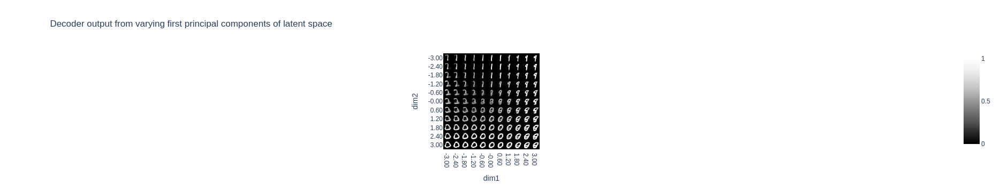

In [72]:
visualise_output(trainer.model)

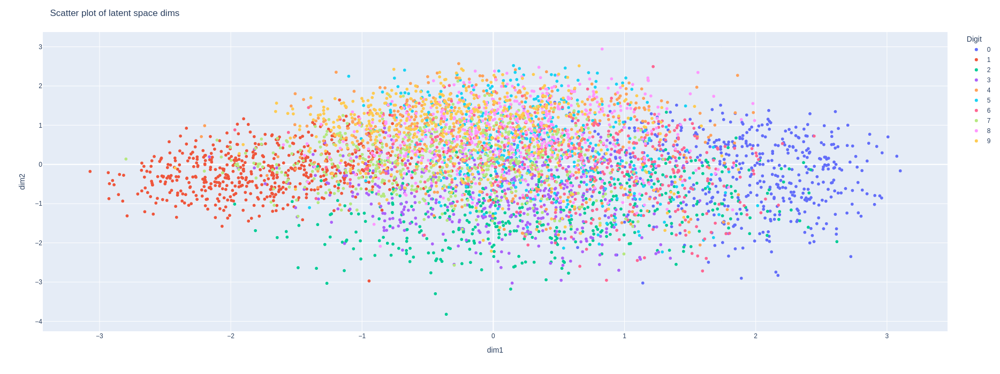

In [79]:
@t.inference_mode()
def visualise_input(
    model: Autoencoder,
    dataset: Dataset,
) -> None:
    '''
    Visualises (in the form of a scatter plot) the input data in the latent space, along the first two dims.
    '''
    # First get the model images' latent vectors, along first 2 dims
    imgs = t.stack([batch for batch, label in dataset]).to(device)
    latent_vectors, *_ = model.sample_latent_vector(imgs)
    
    
    if latent_vectors.ndim == 3: latent_vectors = latent_vectors[0] # useful for VAEs later
    latent_vectors = latent_vectors[:, :2].cpu().numpy()
    labels = [str(label) for img, label in dataset]
    
    # Make a dataframe for scatter (px.scatter is more convenient to use when supplied with a dataframe)
    df = pd.DataFrame({"dim1": latent_vectors[:, 0], "dim2": latent_vectors[:, 1], "label": labels})
    df = df.sort_values(by="label")
    fig = px.scatter(df, x="dim1", y="dim2", color="label")
    fig.update_layout(height=700, width=700, title="Scatter plot of latent space dims", legend_title="Digit")
    data_range = df["dim1"].max() - df["dim1"].min()

    # Add images to the scatter plot (optional)
    # output_on_data_to_plot = model.encoder(HOLDOUT_DATA.to(device))[:, :2].cpu()
    # if output_on_data_to_plot.ndim == 3: output_on_data_to_plot = output_on_data_to_plot[0] # useful for VAEs; see later
    # data_translated = (HOLDOUT_DATA.cpu().numpy() * 0.3081) + 0.1307
    # data_translated = (255 * data_translated).astype(np.uint8).squeeze()
    # for i in range(10):
    #     x, y = output_on_data_to_plot[i]
    #     fig.add_layout_image(
    #         source=Image.fromarray(data_translated[i]).convert("L"),
    #         xref="x", yref="y",
    #         x=x, y=y,
    #         xanchor="right", yanchor="top",
    #         sizex=data_range/15, sizey=data_range/15,
    #     )
    fig.show()


small_dataset = Subset(get_dataset("MNIST"), indices=range(0, 5000))    
visualise_input(trainer.model, small_dataset)